# Chapter 4: experiments

**Purpose**: Run experiments described in Chapter 4 (extended model).

These are:
1. No ITN use; 50 model runs.
2. Varied ITN use; 20 model runs per value. ITN use $\in (0, 0.5, 1.0)$.
3. Varied $K_v$ values; 20 model runs per value.

# 0 Imports

In [1]:
# MPL stuff
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import matplotlib.pyplot as plt

import matplotlib

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.weight": "medium",
    "font.serif": "cmr10",  # cmr10 is part of Computer Modern Roman
    "axes.labelsize": 12,   # Corresponds to 12pt
    "font.size": 12,        # General font size
    "legend.fontsize": 12,  # Legend font size
    "xtick.labelsize": 12,  # X-axis tick label size
    "ytick.labelsize": 12,  # Y-axis tick label size
    'axes.formatter.use_mathtext': True,
})

from tol_colors import tol_cmap, tol_cset
cmap = tol_cset('vibrant')

import numpy as np
import pandas as pd
import seaborn as sns
from tqdm.notebook import tqdm_notebook


# Model stuff -- using baseline model
import sys
sys.path.append("../../models/new_baseline")

from model.model import *
from model.model_presets import BASELINE_MODEL, HIGH_MOVEMENT


# Utils
def derive_mu_sigma_lognormal(mean, variance):
    """Given mu and sigma from a log-normal distribution, find the mean and variance."""
    sigma = np.sqrt(np.log(variance/(mean**2) + 1))
    mu    = np.log(mean) - .5*(sigma**2)
    return mu, sigma

def run_model(n, names, param_sets, debug=True):
    """Run the model for `n` runs per scenario under each name-parameters pair."""
    data = {name: None for name in names}

    for name, params in zip(names, param_sets):
        if debug: print(f"Running scenario '{name}'...")
        
        scenario_res = [None] * n
        for i in tqdm_notebook(range(n)):
            m = BaselineModel(**params)
            run, _ = m.run()

            scenario_res[i] = run

            # add additional info for number of agents in occupations
            scenario_res[i]["amts"] = (np.sum([a.forest_worker for a in m.agents]),
                                        np.sum([a.field_worker for a in m.agents]),
                                        np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))
        data[name] = scenario_res

    return data


def plot_colours(cmap):
    colors = matplotlib.colors.ListedColormap(cmap)(np.arange(len(cmap)))
    
    # Display the colors
    fig, ax = plt.subplots(figsize=(8, 2))
    ax.imshow([colors], extent=[0, len(cmap), 0, 1])
    ax.set_xticks(np.arange(len(cmap)) + 0.5)
    ax.set_xticklabels(np.arange(len(cmap)))
    ax.set_yticks([])  # Remove y-axis ticks
    plt.show()


def run_similarity_orderings(arrs):
    """Requires `arrs`, a (num_runs) x (num_points) matrix.
    
    Uses Euclidean distances to sort indices in ascending order of
    pairwise distance."""
    dists = np.zeros(len(arrs))
    
    for r in range(len(arrs)):
        dists[r] = np.sqrt(np.sum((np.delete(arrs, r, axis=0) - arrs[r, :])**2, axis=1).sum())

    return np.arange(0, len(arrs))[np.argsort(dists)]


def tricolor(c, amount=0.5):
    """Takes a colour `c`, lightens it, darkens it, and returns [light, `c`, dark]"""
    import colorsys
    
    h, l, s = colorsys.rgb_to_hls(*matplotlib.colors.to_rgb(c))
    c1 = colorsys.hls_to_rgb(h, 1 - amount * (1 - l), s)
    c2 = colorsys.hls_to_rgb(h, 1 - amount * (1 - (1-l)), s)
    
    return [c1, c, c2]


# deriving ideal fig size
pt = 1./72.27
my_width = 426.79135*pt
golden = (1 + 5 ** 0.5) / 2
IDEAL_FIG_SIZE = (my_width, my_width/golden)

# NOTE: setting seed here.
np.random.seed(1389498)

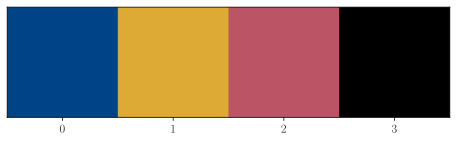

In [2]:
plot_colours(tol_cset('high-contrast'))

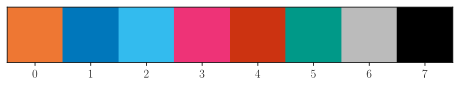

In [3]:
plot_colours(tol_cset('vibrant'))

## 1 No ITN use (default settings)

Run the model 50 times using no modifiers, make plots.

In [4]:
scenario_1_params = {
    # old parameters
    "movement_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1, .001)), # high movement
    "sigma_h_arr" : np.array([19, 19, 19]),
    "sigma_v_arr" : np.array([.5, .5, .5]),
    "psi_v_arr" : np.array([.3, .3, .3]),
    "beta_hv_arr" : np.array([.33, .33, .33]),
    "beta_vh_arr" : np.array([.33, .33, .33]),
    "nu_v_arr" : np.array([.1, .1, .1]),
    "mu_v_arr" : np.array([1/14, 1/14, 1/14]),
    "edge_prob" : .03,
    "initial_infect_proportion" : .005,
    "nu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/5, .001)),
    "mu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/6, .001)),
    "total_time" : 200,
    "mosquito_timestep" : .005,

    # custom parameters -- calibrated
    "k" : 3,
    "timestep" : (2/24),
    "patch_densities" : np.array([.85, .08, .07]),
    "num_households" : 2_351,
    "num_agents" : 10_053,
    "K_v_arr" : np.array([2700, 8100, 9450]),
    "patch_init_infect_vector_prop_arr" : [.0, .0, .0],
    "prob_adopt_itn": .0,
    "stay_home_chance": .0,
}

In [5]:
data = run_model(50, ['default'], [scenario_1_params])["default"]

Running scenario 'default'...


  0%|          | 0/50 [00:00<?, ?it/s]

### Top-down: basic time series

(1) Plot of agent time series

In [7]:
plt.rcParams.update({
    "axes.spines.right": False,
    "axes.spines.top": False,
    "legend.frameon": False,
})

In [8]:
infs = [data[i]["total_infected"] for i in range(len(data))]
np.mean(infs)/10053, np.std(infs)/10053

(0.92850890281508, 0.004278729480389275)

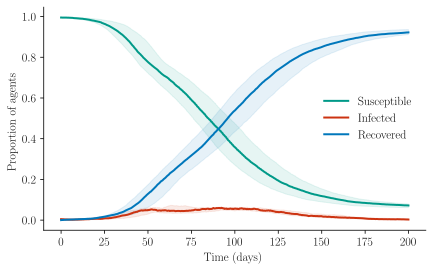

In [9]:
def plot_seir_shaded_bands(ax, data, seir: int, hl_run: int, label: str, colours, agents=10053):
    mins = np.min([np.sum(data[i]["agent_disease_counts"],axis=0)[seir] for i in range(len(data))],axis=0)/agents
    maxs = np.max([np.sum(data[i]["agent_disease_counts"],axis=0)[seir] for i in range(len(data))],axis=0)/agents

    ax.plot(data[hl_run]["time"],
            np.sum(data[hl_run]["agent_disease_counts"],axis=0)[seir]/agents,
            color=colours[seir],
            linewidth=2,
            label=label)
    ax.fill_between(data[hl_run]["time"],
                           mins,
                           maxs,
                           color=colours[seir],
                           alpha=.1)

cmap = tol_cset('vibrant')

colours = [
    cmap[5],
    cmap[0],
    cmap[4],
    cmap[1]
]

hl_run = run_similarity_orderings(np.array([np.sum(data[r]["agent_disease_counts"],axis=0)[0]/10053 for r in range(len(data))]))[0]
plt.figure(layout='constrained', figsize=IDEAL_FIG_SIZE)

plot_seir_shaded_bands(plt.gca(), data, 0, hl_run, "Susceptible", colours)
plot_seir_shaded_bands(plt.gca(), data, 2, hl_run, "Infected", colours)
plot_seir_shaded_bands(plt.gca(), data, 3, hl_run, "Recovered", colours)

# plt.title("Agent disease dynamics over time")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents")

plt.legend()
# plt.tight_layout()
plt.savefig('figs/no_itn_disease_dynamics.pdf')

(2) Plot of vector time series

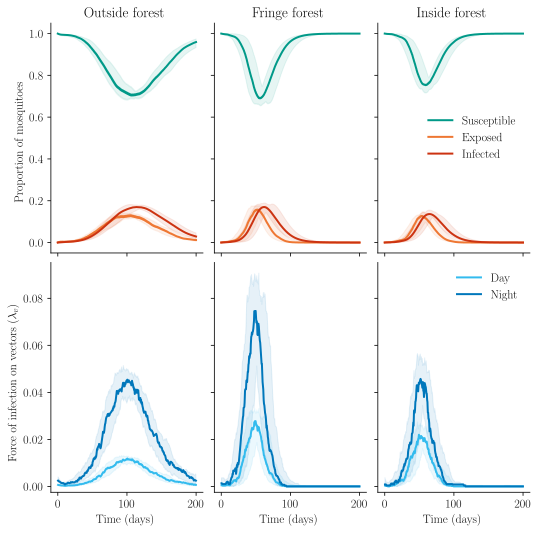

In [14]:
def plot_mosquito_dynamics_with_bands(ax, patch_id, data, hl_run, colours, draw_legend):
    hl_run = run_similarity_orderings(np.array([data[r]["patch_sei"][patch_id].T[0]/data[r]["patch_sei"][patch_id].sum(axis=1)[0] for r in range(len(data))]))[0]
    
    for j, (c, l) in enumerate(zip(colours, ["Susceptible", "Exposed", "Infected"])):
        ax.plot(data[hl_run]["time"],
                data[hl_run]["patch_sei"][patch_id].T[j]/data[hl_run]["patch_sei"][patch_id].sum(axis=1)[0],
                color=c,
                linewidth=2,
                label=l if draw_legend else None)
        ax.set_ylim(-0.05,1.05)

        mins = np.min([data[r]["patch_sei"][patch_id].T[j]/data[r]["patch_sei"][patch_id].sum(axis=1)[0] for r in range(len(data))],axis=0)
        maxs = np.max([data[r]["patch_sei"][patch_id].T[j]/data[r]["patch_sei"][patch_id].sum(axis=1)[0] for r in range(len(data))],axis=0)
        ax.fill_between(data[hl_run]["time"],
                               mins,
                               maxs,
                               color=c,
                               alpha=.1)
        if draw_legend: ax.legend()


def plot_force_infection_with_bands(ax, patch_id, data, hl_run, colours, draw_legend):
    """Provide colours in form of [daytime colour, nighttime colour]."""
    # get convenient a[hr] => i mapping
    hr_mapping = np.arange(0, 24)
    hr_mapping[np.arange(0,24,2)] = np.arange(0,24,2) / 2

    # set day/night hrs (8/18 are omitted due to spread)
    daytime_hrs = hr_mapping[np.array([10, 12, 14, 16])]
    # night_hrs   = hr_mapping[np.array([0, 2, 4, 6, 8, 18, 20, 22])]
    night_hrs   = hr_mapping[np.array([8, 18])]

    # compute indices based on hours
    num_days = len(data[0]["time"]) // 12
    all_idx = np.arange(num_days * 12)
    day_inds = all_idx.reshape(num_days, 12)[:, daytime_hrs].flatten()
    night_inds = all_idx.reshape(num_days, 12)[:, night_hrs].flatten()

    # find most representative run
    hl_run_day   = run_similarity_orderings(np.array([np.array(data[r]["lambda_v"][patch_id])[day_inds] for r in range(len(data))]))[0]
    hl_run_night = run_similarity_orderings(np.array([np.array(data[r]["lambda_v"][patch_id])[night_inds] for r in range(len(data))]))[0]
    
    # plot daytime line + shaded bands
    mins = np.min([np.array(data[r]["lambda_v"][patch_id])[day_inds] for r in range(len(data))],axis=0)
    maxs = np.max([np.array(data[r]["lambda_v"][patch_id])[day_inds] for r in range(len(data))],axis=0)
    
    ax.fill_between(np.array(data[hl_run_day]["time"])[day_inds],
                                   mins,
                                   maxs,
                                   color=colours[0],
                                   alpha=.1)
    ax.plot(np.array(data[hl_run_day]["time"])[day_inds],
             np.array(data[hl_run_day]["lambda_v"][patch_id])[day_inds],
             color=colours[0],
             linewidth=2,
             label="Day" if draw_legend else None)
    
    # compute nightly rates
    mins = np.min([np.array(data[r]["lambda_v"][patch_id])[night_inds] for r in range(len(data))],axis=0)
    maxs = np.max([np.array(data[r]["lambda_v"][patch_id])[night_inds] for r in range(len(data))],axis=0)
    
    ax.fill_between(np.array(data[hl_run_night]["time"])[night_inds],
                                   mins,
                                   maxs,
                                   color=colours[1],
                                   alpha=.1)
    ax.plot(np.array(data[hl_run_night]["time"])[night_inds],
             np.array(data[hl_run_night]["lambda_v"][patch_id])[night_inds],
             color=colours[1],
             linewidth=2,
             label="Night" if draw_legend else None)

    if draw_legend: ax.legend()#title=r"$\lambda_v$")


names = ["Outside forest", "Fringe forest", "Inside forest"]
hl_run = 3
legend_ax = 2

fig, axs = plt.subplots(layout='constrained', nrows=2, ncols=3, sharex=True, sharey=False, figsize=(IDEAL_FIG_SIZE[0]*1.25, IDEAL_FIG_SIZE[1]*2))

# plot mosquito disease dynamics
for i, col in enumerate(axs[0]):
    plot_mosquito_dynamics_with_bands(col, i, data, hl_run, colours, i == legend_ax)
    col.set_title(names[i])
    if i == 0:
        col.set_ylabel("Proportion of mosquitoes")
    else:
        col.set_yticklabels([])

# plot force of infection
max_lambda_v = np.max([[data[r]["lambda_v"][j] for j in range(3)] for r in range(len(data))])
for i, col in enumerate(axs[1]):
    plot_force_infection_with_bands(col, i, data, hl_run, [cmap[2], cmap[1]], i == legend_ax)
    # col.plot(data[0]['time'], data[0]["lambda_v"][i])
    # plot_force_infection_with_bands(col, i, data, hl_run, [cmap[1], cmap[2]], i == legend_ax)
    col.set_ylim(-0.0025,max_lambda_v*1.05)
    if i == 0:
        col.set_ylabel(r'Force of infection on vectors ($\lambda_v$)')
    else:
        col.set_yticklabels([])

# fig.suptitle("Mosquito disease dynamics across patches over time")
for i in range(3): axs[1,i].set_xlabel("Time (days)")
# fig.supxlabel("Time (days)")
# fig.supylabel("Proportion of mosquitoes")

# fig.tight_layout()
plt.savefig('figs/no_itn_mosquito_dynamics.pdf')

### Frequency of infection times

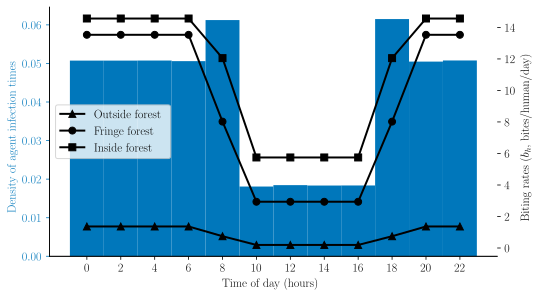

In [18]:
cmap = tol_cset('vibrant')
fig, ax = plt.subplots(layout='constrained', figsize=(IDEAL_FIG_SIZE[0]*1.25, IDEAL_FIG_SIZE[1]*1.1))

# plotting frequency of infections across time during day
l_ax_color = cmap[1]
ax.set_xticks(np.arange(0,24,2))
# ax.set_title("Frequency of infection times and biting rates")
ax.set_xlabel("Time of day (hours)")
ax.set_ylabel("Density of agent infection times", color=l_ax_color)
ax.tick_params(axis='y', color=l_ax_color, labelcolor=l_ax_color)

agg_y_vals = np.array([np.unique(((pd.DataFrame(data[r]["infection_records"]).time * (2/24) * 24) % 24).map(np.round), return_counts=True)[1] for r in range(len(data))]).sum(axis=0)
ax.bar(np.arange(0,24,2),
        agg_y_vals/(2*agg_y_vals).sum(),
        width=24/12,
       color=l_ax_color)

def plot_biting_rate_bands(ax, data, patch_id, colour, label, marker):
    tick_start = 24 * 1
    t = np.arange(start_time:=(tick_start*(2/24)*24 % 24), # time in simulation (hrs)
                  start_time+24, # 1 day window
                  step=24*(2/24))
    values = np.array([(df:=pd.DataFrame(data[r]["patch_values"]))[df.patch_id == patch_id].b_h.reset_index(drop=True)[tick_start:tick_start+int(24/2)] for r in range(len(data))])

    # mins = np.min(values,axis=0)
    # maxs = np.max(values,axis=0)
    # ax.fill_between(t,
    #                mins,
    #                maxs,
    #                color=colour,
    #                alpha=.1)
    
    ax.plot(t,
            values[run_similarity_orderings(values)][0],
            f'{marker}-', # TODO: change these symbols to differentiate between patches
            color=colour,
            linewidth=2,
            markersize=7,
            label=label)

# plotting biting rates with bands
r_ax = ax.twinx()
r_c_base = 'black'

r_ax.set_ylabel(r"Biting rates ($b_h$, bites/human/day)", color=r_c_base)
r_ax.tick_params(axis='y', color=r_c_base, labelcolor=r_c_base)

for patch_id, label, c, m in zip(range(3), ["Outside forest", "Fringe forest", "Inside forest"], [r_c_base for _ in range(3)], ["^", "o", "s"]):#tricolor(r_c_base, amount=.9)):
    plot_biting_rate_bands(r_ax, data, patch_id, c, label, m)

r_ax.legend(frameon=True)
# fig.tight_layout()
plt.savefig('figs/no_itn_freq_infection.pdf')

### Cumulative infected agents per patch

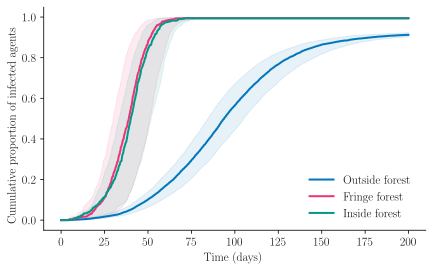

In [19]:
def plot_cum_patch_with_bands(ax, patch_id, data, colour, label):
    # compute cumsums for runs
    cumsums = np.zeros((len(data), 2400))
    for r in range(len(data)):
        df = pd.DataFrame(data[r]["infection_records"])
        df = df[df.home_patch == patch_id].groupby(by=["time"]).size().reset_index()
        cumsums[r, df.time] = df.iloc[:, 1]
        cumsums[r] = cumsums[r].cumsum()/data[r]["agent_group_pops"][patch_id]
    
    mins = np.min(cumsums, axis=0)
    maxs = np.max(cumsums, axis=0)
    ax.fill_between(data[0]["time"],
                           mins,
                           maxs,
                           color=colour,
                           alpha=.1)
    
    ax.plot(data[0]["time"],
            cumsums[run_similarity_orderings(cumsums)[0]],
            color=colour,
            linewidth=2,
            label=label)


plt.figure(layout='constrained', figsize=IDEAL_FIG_SIZE)

for i, c, l in zip(range(3), [cmap[1], cmap[3], cmap[5]], ["Outside forest", "Fringe forest", "Inside forest"]):
    plot_cum_patch_with_bands(plt.gca(), i, data, c, l)

# plt.title("Cumulative infected agents in patches")
plt.xlabel("Time (days)")
plt.ylabel("Cumulative proportion of infected agents")
plt.legend()

# plt.tight_layout()
plt.savefig('figs/no_itn_cum_infected_agents.pdf')

### Agent risk group & location infections

(1) Risk group infections & cumulative infections

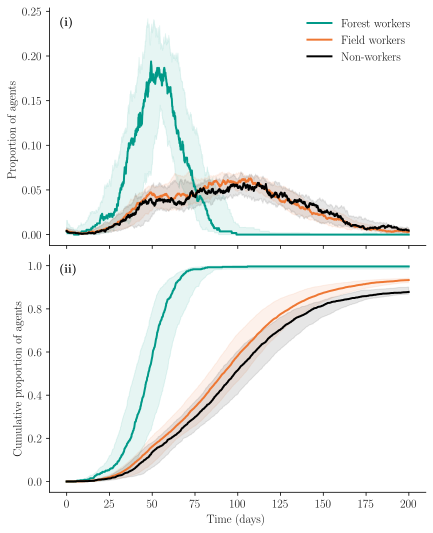

In [20]:
def plot_infections_risk_group(data, ax, colours):
    for i, risk_group in enumerate(["Forest workers", "Field workers", "Non-workers"]):
        infections = np.array([data[r]["agent_disease_counts"][i][2]/data[r]['amts'][i] for r in range(len(data))])

        mins = np.min(infections, axis=0)
        maxs = np.max(infections, axis=0)
        ax.fill_between(data[0]["time"],
                           mins,
                           maxs,
                           color=colours[i],
                           alpha=.1)

        hl_run = run_similarity_orderings(infections)[0]
        ax.plot(data[0]["time"],
                data[hl_run]["agent_disease_counts"][i][2]/data[hl_run]['amts'][i],
                color=colours[i],
                linewidth=2,
                label=risk_group)


def plot_cum_infections_risk_group(data, ax, colours):
    for i, risk_group in enumerate(["Forest workers", "Field workers", "Non-workers"]):
        cum_infs = np.array([data[r]["agent_infected_unique"][i].cumsum()/data[r]['amts'][i] for r in range(len(data))])

        mins = np.min(cum_infs, axis=0)
        maxs = np.max(cum_infs, axis=0)
        ax.fill_between(data[0]["time"],
                           mins,
                           maxs,
                           color=colours[i],
                           alpha=.1)

        hl_run = run_similarity_orderings(cum_infs)[0]
        ax.plot(data[0]["time"],
                data[hl_run]["agent_infected_unique"][i].cumsum()/data[hl_run]['amts'][i],
                linewidth=2,
                color=colours[i])


fig, axs = plt.subplots(layout='constrained', nrows=2, ncols=1, sharex=True, figsize=(IDEAL_FIG_SIZE[0]*1, IDEAL_FIG_SIZE[1]*2))

risk_group_colours = [cmap[5], cmap[0], cmap[7]]
plot_infections_risk_group(data, axs[0], risk_group_colours)
plot_cum_infections_risk_group(data, axs[1], risk_group_colours)

# axs[0].set_title("(a)", loc='left')
axs[0].legend()

axs[1].set_xlabel("Time (days)")
# axs[1].set_title("Cumulative infected agents over time")

axs[0].annotate(r"\textbf{(i)}", xy=(0.025, 0.925), xycoords="axes fraction")
axs[1].annotate(r"\textbf{(ii)}", xy=(0.025, 0.925), xycoords="axes fraction")

axs[0].set_ylabel("Proportion of agents")
axs[1].set_ylabel("Cumulative proportion of agents")

# fig.tight_layout()
plt.savefig('figs/no_itn_agent_infection_cum_occupation.pdf')

(2) Locations in which agents are infected

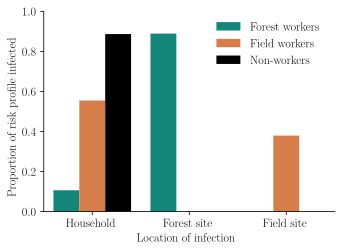

In [21]:
# aggregate statistics across all runs
agg_infection_records = []
for r in data:
    agg_infection_records += r["infection_records"]
agg_amts = np.array([data[r]['amts'] for r in range(len(data))]).sum(axis=0)

# turn records into table
df = pd.DataFrame(agg_infection_records).groupby(by=["worker_type", "activity_id"]).size().reset_index(name="num")
df["num"] = df.num.map(float)

# normalise
for i, _ in df.iterrows():
    df.iloc[i, 2] /= agg_amts[(df.iloc[i,0])]

df["worker_type"] = df.worker_type.map({0: "Forest workers", 1: "Field workers", 2: "Non-workers"})
df["activity_id"] = df.activity_id.map({0: "Household", 1: "Forest site", 2: "Field site"})

# category plot
g = sns.catplot(
    data=df,
    kind="bar",
    x="activity_id",
    y="num",
    hue="worker_type",
    # errorbar="sd",
    height=IDEAL_FIG_SIZE[1],
    aspect=.9,
    palette=sns.color_palette([cmap[5], cmap[0], cmap[7]]))

plt.ylim(0,1)
# plt.title("Agent exposure locations by occupation type")
g.set_axis_labels("Location of infection", "Proportion of risk profile infected")

g._legend.remove()
plt.legend()

plt.tight_layout()
plt.savefig('figs/no_itn_exposure_location.pdf')

In [20]:
df

,worker_type,activity_id,num
0,Forest workers,Household,0.101652
1,Forest workers,Forest site,0.893202
2,Field workers,Household,0.554326
3,Field workers,Field site,0.378673
4,Non-workers,Household,0.884384


## 2 Impacts of ITN use

Run the model 60 times (20 per ITN rate). ITN rates are 0%, 50%, 100%.

In [8]:
plt.rcParams.update({
    "axes.spines.right": False,
    "axes.spines.top": False,
    "legend.frameon": False,
})

In [4]:
# same as scenario 1.
scenario_2_0pc = {
    # old parameters
    "movement_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1, .001)), # high movement
    "sigma_h_arr" : np.array([19, 19, 19]),
    "sigma_v_arr" : np.array([.5, .5, .5]),
    "psi_v_arr" : np.array([.3, .3, .3]),
    "beta_hv_arr" : np.array([.33, .33, .33]),
    "beta_vh_arr" : np.array([.33, .33, .33]),
    "nu_v_arr" : np.array([.1, .1, .1]),
    "mu_v_arr" : np.array([1/14, 1/14, 1/14]),
    "edge_prob" : .03,
    "initial_infect_proportion" : .005,
    "nu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/5, .001)),
    "mu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/6, .001)),
    "total_time" : 200,
    "mosquito_timestep" : .005,

    # custom parameters -- calibrated
    "k" : 3,
    "timestep" : (2/24),
    "patch_densities" : np.array([.85, .08, .07]),
    "num_households" : 2_351,
    "num_agents" : 10_053,
    "K_v_arr" : np.array([2700, 8100, 9450]),
    "patch_init_infect_vector_prop_arr" : [.0, .0, .0],
    "prob_adopt_itn": .0,
    "stay_home_chance": .0,
}

scenario_2_50pc = scenario_2_0pc.copy()
scenario_2_50pc["prob_adopt_itn"] = .5

scenario_2_100pc = scenario_2_0pc.copy()
scenario_2_100pc["prob_adopt_itn"] = 1.

In [5]:
data = run_model(20, ['0%', '50%', '100%'], [scenario_2_0pc, scenario_2_50pc, scenario_2_100pc])

Running scenario '0%'...


  0%|          | 0/20 [00:00<?, ?it/s]

Running scenario '50%'...


  0%|          | 0/20 [00:00<?, ?it/s]

Running scenario '100%'...


  0%|          | 0/20 [00:00<?, ?it/s]

### Infections and cumulative infections

(1) Infections & cumulative infections across ITN use

In [6]:
# compute cumsums for runs
data_sub = data["0%"]

cumsums = np.zeros((len(data_sub), 2400))

for r in range(len(data_sub)):
    df = pd.DataFrame(data_sub[r]["infection_records"])
    df = df.groupby(by=["time"]).size().reset_index()
    cumsums[r, df.time] = df.iloc[:, 1]
    cumsums[r] = cumsums[r].cumsum()/10053

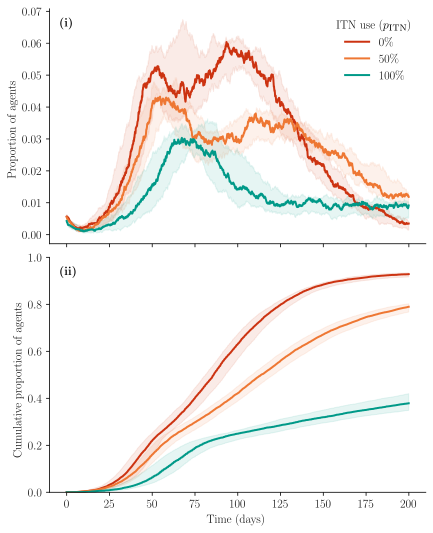

In [18]:
def plot_infections_itn_use(data, ax, colours, labels):    
    for i, (data_sub, c, l) in enumerate(zip(data.values(), colours, labels)):
        infections = np.array([np.sum(data_sub[i]["agent_disease_counts"],axis=0)[2] for i in range(len(data_sub))])/10053

        mins = np.min(infections, axis=0)
        maxs = np.max(infections, axis=0)

        ax.fill_between(data_sub[0]["time"],
                   mins,
                   maxs,
                   color=c,
                   alpha=.1)

        hl_run = run_similarity_orderings(infections)[0]
        ax.plot(data_sub[0]["time"],
                np.sum(data_sub[hl_run]["agent_disease_counts"],axis=0)[2]/10053,
                color=c,
                linewidth=2,
                label=l)


def plot_cum_infections_itn_use(data, ax, colours, labels):
    for i, (data_sub, c, l) in enumerate(zip(data.values(), colours, labels)):
        # compute cumsums for runs
        cumsums = np.zeros((len(data_sub), 2400))
        
        for r in range(len(data_sub)):
            df = pd.DataFrame(data_sub[r]["infection_records"])
            df = df.groupby(by=["time"]).size().reset_index()
            cumsums[r, df.time] = df.iloc[:, 1]
            cumsums[r] = cumsums[r].cumsum()/10053
        
        mins = np.min(cumsums, axis=0)
        maxs = np.max(cumsums, axis=0)
        ax.fill_between(data_sub[0]["time"],
                               mins,
                               maxs,
                               color=c,
                               alpha=.1)
        
        ax.plot(data_sub[0]["time"],
                cumsums[run_similarity_orderings(cumsums)[0]],
                color=c,
                linewidth=2,
                label=l)


fig, axs = plt.subplots(layout='constrained', nrows=2, ncols=1, sharex=True, figsize=(IDEAL_FIG_SIZE[0]*1, IDEAL_FIG_SIZE[1]*2))
labels = ["0\%", "50\%", "100\%"]

risk_group_colours = [cmap[4], cmap[0], cmap[5]]
plot_infections_itn_use(data, axs[0], risk_group_colours, labels)
plot_cum_infections_itn_use(data, axs[1], risk_group_colours, labels)

# axs[0].set_title("Infected agents over time with varying ITN use")
axs[0].legend(title=r"ITN use ($p_{\textsc{itn}}$)")

axs[0].annotate(r"\textbf{(i)}", xy=(0.025, 0.925), xycoords="axes fraction")
axs[1].annotate(r"\textbf{(ii)}", xy=(0.025, 0.925), xycoords="axes fraction")

axs[1].set_ylim(0,1)

axs[1].set_xlabel("Time (days)")

axs[0].set_ylabel("Proportion of agents")
axs[1].set_ylabel("Cumulative proportion of agents")

plt.savefig('figs/itn_agent_infection_p_use.pdf')

(2) Impact of ITN use on risk groups

In [12]:
fig, axs = plt.subplots(layout='constrained', 
                        nrows=2, ncols=3, sharey='row', 
                        sharex=True, 
                        figsize=(IDEAL_FIG_SIZE[0]*1.5, IDEAL_FIG_SIZE[1]*1.5))

def plot_non_cum_row(data, row_ax, colours, itn_labs, legend_no=0):
    # for each ax in row look at risk group
    for i, ax in enumerate(row_ax):
        
        # for each ITN use run set, plot lines
        for j, (data_sub, itn_lab) in enumerate(zip(data.values(), itn_labs)):
            infections = np.array([data_sub[r]["agent_disease_counts"][i][2]/data_sub[r]['amts'][i] for r in range(len(data_sub))])

            mins = np.min(infections, axis=0)
            maxs = np.max(infections, axis=0)
            ax.fill_between(data_sub[0]["time"],
                               mins,
                               maxs,
                               color=colours[j],
                               alpha=.1)
    
            hl_run = run_similarity_orderings(infections)[0]
            ax.plot(data_sub[0]["time"],
                    data_sub[hl_run]["agent_disease_counts"][i][2]/data_sub[hl_run]['amts'][i],
                    color=colours[j],
                    linewidth=2,
                    label=itn_labs[j] if i == legend_no else None)


def plot_cum_row(data, row_ax, colours, itn_labs, legend_no=0):
    # for each ax in row look at risk group
    for i, ax in enumerate(row_ax):
        
        # for each ITN use run set, plot cumulative infection lines
        for j, (data_sub, itn_lab) in enumerate(zip(data.values(), itn_labs)):
            cum_infs = np.array([data_sub[r]["agent_infected_unique"][i].cumsum()/data_sub[r]['amts'][i] for r in range(len(data_sub))])
    
            mins = np.min(cum_infs, axis=0)
            maxs = np.max(cum_infs, axis=0)
            ax.fill_between(data_sub[0]["time"],
                               mins,
                               maxs,
                               color=colours[j],
                               alpha=.1)
    
            hl_run = run_similarity_orderings(cum_infs)[0]
            ax.plot(data_sub[0]["time"],
                    data_sub[hl_run]["agent_infected_unique"][i].cumsum()/data_sub[hl_run]['amts'][i],
                    linewidth=2,
                    color=colours[j])
            
legend_no = 2
itn_use_colours = [cmap[4], cmap[0], cmap[5]]
labels = ["0\%", "50\%", "100\%"]

plot_non_cum_row(data, axs[0, :], itn_use_colours, labels, legend_no=legend_no)
plot_cum_row(data, axs[1, :], itn_use_colours, labels)

axs[0,0].set_title("Forest workers")
axs[0,1].set_title("Field workers")
axs[0,2].set_title("Non-workers")

# fig.supylabel("Proportion of infected agents")
axs[0,0].set_ylabel("Proportion of agents")
axs[1,0].set_ylabel("Cumulative proportion")

axs[0,legend_no].legend(title=r"ITN use ($p_{\textsc{itn}}$)")

# fig.suptitle("Impacts of ITN use on infected agents over simulation time per occupation")
for i in range(3): axs[1, i].set_xlabel("Time (days)")

# fig.tight_layout()
plt.savefig('figs/itn_risk_groups.pdf')

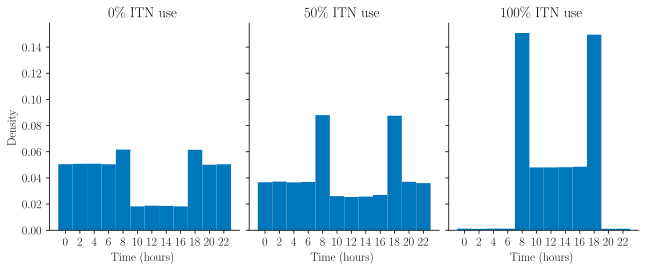

In [19]:
fig, axs = plt.subplots(layout='constrained',
                        nrows=1, ncols=3, sharey=True,
                        figsize=(IDEAL_FIG_SIZE[0]*1.5, IDEAL_FIG_SIZE[1]*1))

for i, (ax, data_sub, itn_lab) in enumerate(zip(axs, data.values(), ["0\%", "50\%", "100\%"])):
    # plotting frequency of infections across time during day
    l_ax_color = cmap[1]
    ax.set_title(f"{itn_lab} ITN use")
    ax.set_xticks(np.arange(0,24,2))
    
    agg_y_vals = np.array([np.unique(((pd.DataFrame(data_sub[r]["infection_records"]).time * (2/24) * 24) % 24).map(np.round), return_counts=True)[1] for r in range(len(data_sub))]).sum(axis=0)
    ax.bar(np.arange(0,24,2),
            agg_y_vals/(2*agg_y_vals).sum(),
            width=24/12,
           color=l_ax_color)
    
    # def plot_biting_rate_bands(ax, data_sub, patch_id, colour, label, marker):
    #     tick_start = 24 * 1
    #     t = np.arange(start_time:=(tick_start*(2/24)*24 % 24), # time in simulation (hrs)
    #                   start_time+24, # 1 day window
    #                   step=24*(2/24))
    #     values = np.array([(df:=pd.DataFrame(data_sub[r]["patch_values"]))[df.patch_id == patch_id].b_h.reset_index(drop=True)[tick_start:tick_start+int(24/2)] for r in range(len(data_sub))])
        
    #     ax.plot(t,
    #             values[run_similarity_orderings(values)][0],
    #             f'{marker}-', # TODO: change these symbols to differentiate between patches
    #             color=colour,
    #             linewidth=2,
    #             markersize=7,
    #             label=label)
    
    # # plotting biting rates with bands
    # r_ax = ax.twinx()
    # r_c_base = 'black'
    
    # r_ax.set_ylabel(r"Biting rates ($b_h$, bites/human/day)", color=r_c_base)
    # r_ax.tick_params(axis='y', color=r_c_base, labelcolor=r_c_base)
    
    # for patch_id, label, c, m in zip(range(3), ["Outside forest", "Fringe forest", "Inside forest"], [r_c_base for _ in range(3)], ["^", "o", "s"]):#tricolor(r_c_base, amount=.9)):
    #     plot_biting_rate_bands(r_ax, data_sub, patch_id, c, label, m)
    # if i == 0: r_ax.legend()

for i in range(3): axs[i].set_xlabel("Time (hours)")
axs[0].set_ylabel("Density")

plt.savefig('figs/itn_freq_infection.pdf')

(3) Locations in which agents are infected [repeat, but important]

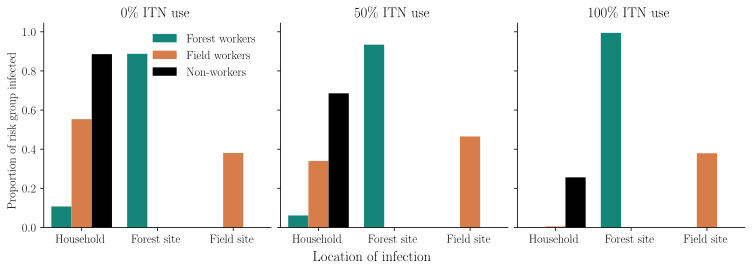

In [14]:
itn_dfs = [None, None, None]

fig, axs = plt.subplots(layout='constrained',
                        nrows=1, ncols=3, sharey=True,
                        figsize=(IDEAL_FIG_SIZE[0]*1.75, IDEAL_FIG_SIZE[1]*1))

for i, (ax, data_sub, itn_lab) in enumerate(zip(axs, data.values(), ["0\%", "50\%", "100\%"])):
    # aggregate statistics across all runs
    agg_infection_records = []
    for r in data_sub:
        agg_infection_records += r["infection_records"]
    agg_amts = np.array([data_sub[r]['amts'] for r in range(len(data_sub))]).sum(axis=0)
    
    # turn records into table
    df = pd.DataFrame(agg_infection_records).groupby(by=["worker_type", "activity_id"]).size().reset_index(name="num")
    df["num"] = df.num.map(float)
    
    # normalise
    for j, _ in df.iterrows():
        df.iloc[j, 2] /= agg_amts[(df.iloc[j,0])]
    
    df["worker_type"] = df.worker_type.map({0: "Forest workers", 1: "Field workers", 2: "Non-workers"})
    df["activity_id"] = df.activity_id.map({0: "Household", 1: "Forest site", 2: "Field site"})

    itn_dfs[i] = df
    
    # category plot
    g = sns.barplot(
        ax=ax,
        data=df,
        # kind="bar",
        x="activity_id",
        y="num",
        hue="worker_type",
        legend= 'auto',
        # errorbar="sd",
        # height=IDEAL_FIG_SIZE[1],
        # aspect=.9,
        palette=sns.color_palette([cmap[5], cmap[0], cmap[7]]))

    g.legend()
    g.set(xlabel="")
    g.set(ylabel="")
    # g.legend().texts[0].set_text("Whatever else")
    # g.set_axis_labels("Location of infection", "Proportion of risk profile infected")
    # if i == 0:
        # ax.set_ylabel("Proportion of risk group infected")
        # ax.set_ylim(0, 1)
        # ax.legend()
        
    # g._legend.remove()
    

    ax.set_title(f"{itn_lab} ITN use")

axs[1].legend([],[], frameon=False)
axs[2].legend([],[], frameon=False)

# fig.suptitle("Agent exposure locations by risk group")
axs[0].set_ylabel("Proportion of risk group infected")
fig.supxlabel("Location of infection")

# fig.tight_layout()
plt.savefig('figs/itn_exposure_locations.pdf')

In [15]:
itn_dfs[0]

,worker_type,activity_id,num
0,Forest workers,Household,0.107324
1,Forest workers,Forest site,0.887409
2,Field workers,Household,0.553633
3,Field workers,Field site,0.380512
4,Non-workers,Household,0.885885


In [16]:
itn_dfs[1]

,worker_type,activity_id,num
0,Forest workers,Household,0.061412
1,Forest workers,Forest site,0.934136
2,Field workers,Household,0.339954
3,Field workers,Field site,0.465092
4,Non-workers,Household,0.685501


In [17]:
itn_dfs[2]

,worker_type,activity_id,num
0,Forest workers,Household,0.000903
1,Forest workers,Forest site,0.994482
2,Field workers,Household,0.005110
3,Field workers,Field site,0.379115
4,Non-workers,Household,0.256043


## 3 Carrying capacity sensitivity analysis

In [4]:
plt.rcParams.update({
    "axes.spines.right": False,
    "axes.spines.top": False,
    "legend.frameon": False,
})

Run the model 60 times (20 per K_v scenario).

1. Derived $K_v$ values (?, ?, ?).
2. Same total volume as (1), distributed equally among patches (?/3=?) for all patches.
3. Same total volume as (1), distributed among patches according to patch densities (85%, 8%, 7%).

**1. Derived $K_v$ values**:

2700, 8100, 9450


**2. Distributed equally among patches**:

$K_v^{\text{total}} = 2700 + 8100 + 9450 = 20250$. Now divide by 3 to get:

6750, 6750, 6750


**3. Distributed according to equal vector-to-host ratio**:

With 10,053 agents, have according to patch densities: (85%, 8%, 7%)=(8,545.05, 804.24, 703.71). Want to distribute 20,250 mosquitoes such that ratio is same across patches.

E.g. if have $20, A=5, B=3, C=2; A<-10, B<-6, C<-4 so that the ratio is equal (10:5 = 6:3 = 4:2).

Via [WolframAlpha](https://www.wolframalpha.com/input?i=solve+%7Bm%3D20250%2C+a%3D%28m_1%29%2F8545.05%2C+b%3D%28m_2%29%2F804.24%2C+c%3D%28m_3%29%2F703.71%2C+a%3Db%2C+b%3Dc%2C+%28m_1%29%2B%28m_2%29%2B%28m_3%29%3Dm%7D), solution exists at vector-to-host ratio of $\frac{2250}{1117}\approx2$ with result:

17212.5, 1620, 1417.5

In [5]:
# same as scenario 1.
scenario_3_1 = {
    # old parameters
    "movement_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1, .001)), # high movement
    "sigma_h_arr" : np.array([19, 19, 19]),
    "sigma_v_arr" : np.array([.5, .5, .5]),
    "psi_v_arr" : np.array([.3, .3, .3]),
    "beta_hv_arr" : np.array([.33, .33, .33]),
    "beta_vh_arr" : np.array([.33, .33, .33]),
    "nu_v_arr" : np.array([.1, .1, .1]),
    "mu_v_arr" : np.array([1/14, 1/14, 1/14]),
    "edge_prob" : .03,
    "initial_infect_proportion" : .005,
    "nu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/5, .001)),
    "mu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/6, .001)),
    "total_time" : 200,
    "mosquito_timestep" : .005,

    # custom parameters -- calibrated
    "k" : 3,
    "timestep" : (2/24),
    "patch_densities" : np.array([.85, .08, .07]),
    "num_households" : 2_351,
    "num_agents" : 10_053,
    "K_v_arr" : np.array([2700, 8100, 9450]),
    "patch_init_infect_vector_prop_arr" : [.0, .0, .0],
    "prob_adopt_itn": .0,
    "stay_home_chance": .0,
}

scenario_3_2 = scenario_3_1.copy()
scenario_3_2["K_v_arr"] = np.array([6750, 6750, 6750])

scenario_3_3 = scenario_3_1.copy()
scenario_3_3["K_v_arr"] = np.array([17212.5, 1620, 1417.5])

In [6]:
data = run_model(20, ['Derived', 'Uniform', 'Vector-to-host'], [scenario_3_1, scenario_3_2, scenario_3_3])

Running scenario 'Derived'...


  0%|          | 0/20 [00:00<?, ?it/s]

Running scenario 'Uniform'...


  0%|          | 0/20 [00:00<?, ?it/s]

Running scenario 'Vector-to-host'...


  0%|          | 0/20 [00:00<?, ?it/s]

### Summary statistics

(1) Distribution of total infected agents [1x1]

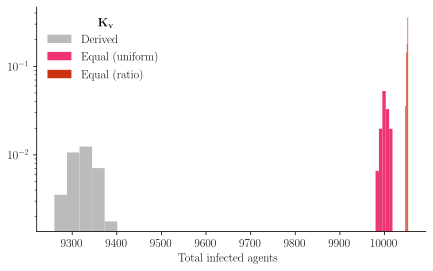

In [7]:
plt.figure(layout='constrained', figsize=IDEAL_FIG_SIZE)

scenario_colours = [cmap[6], cmap[3], cmap[4]]
scenario_labs    = ["Derived", "Equal (uniform)", "Equal (ratio)"]

infection_counts = {name: [data[name][i]["total_infected"] for i in range(len(data[name]))] for name in data}

for infs, l, c in zip(infection_counts.values(), scenario_labs, scenario_colours):
    plt.hist(
        infs,
        density=True,
        color=c,
        bins=5,
        label=l,
    )
    # sns.kdeplot(
    #     infs,
    #     bw_adjust=1,
    #     color=c,
    #     label=l,
    #     linewidth=2
    # )

# for name, c in zip(cur_names, scenario_colours):
#     plt.hist(infection_counts[name], density=True, color=color, bins=100, alpha=.4)
#     sns.kdeplot(infection_counts[name], bw_adjust=.55, color=color, label=name, linewidth=2)

# plt.xlim(0, 10053)
plt.yscale(value="log")
plt.xlabel("Total infected agents")

# plt.title("Distribution of total agents infected at simulation end")
# plt.gca().spines[['right', 'top']].set_visible(False)
# plt.ylim(0,0.009)
plt.legend(title=r"$\mathbf{K_v}$")

# for line_no, name in enumerate(cur_names):
#     line_data = plt.gca().lines[line_no].get_xydata()
#     print(f"Scenario '{name}: {line_data[np.argmax(line_data[:, 1])]}")

# plt.tight_layout()
plt.savefig("figs/k_v_distribution_impacted.pdf")

In [8]:
[(scen, np.mean(infection_counts[scen]), np.std(infection_counts[scen])) for scen in data]

[('Derived', 9326.35, 31.588407683832376),
 ('Uniform', 10000.95, 8.760565050269303),
 ('Vector-to-host', 10051.0, 1.6431676725154984)]

(2) Timing of epidemic peak across patches [3x1]

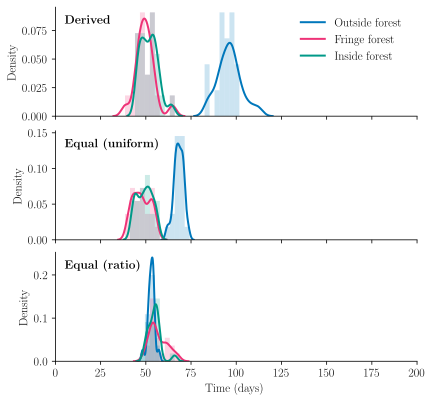

In [14]:
fig, axs = plt.subplots(layout='constrained',
                        nrows=3, ncols=1, sharex=True,
                        figsize=(IDEAL_FIG_SIZE[0], IDEAL_FIG_SIZE[1]*1.5))
peak_infection_times = {name: {patch: [np.argmax(data[name][i]["num_infected"][patch])/12 for i in range(len(data[name]))] for patch in range(3)} for name in data}
patch_names = ["Outside forest", "Fringe forest", "Inside forest"]

cur_name = 0
for row, peak_times, scenario_name in zip(axs, peak_infection_times.values(), scenario_labs):
    for (patch_times, patch_name, c) in zip(peak_times.values(), patch_names, [cmap[1], cmap[3], cmap[5]]):
        max_y = 100
        min_y = 0
        binwidth  = .0275*(max_y-min_y)
        
        sns.kdeplot(
            patch_times,
            ax=row,
            bw_adjust=.75,
            color=c,
            label=patch_name if cur_name == 0 else None,
            linewidth=2)
        row.hist(
            patch_times,
            density=True,
            color=c,
            bins=np.arange(binwidth, max_y + binwidth, binwidth),
            # bins=5,
            alpha=.2)

    row.set_xlim(0,200)
    
    row.set_xlabel("")
    row.set_ylabel("")

    # row.set_title(scenario_name)
    row.annotate(r"\textbf{"+scenario_name+"}", xy=(0.025, 0.85), xycoords="axes fraction")


    if cur_name==0:
        row.legend()
        cur_name += 1

# fig.suptitle("Timing of epidemic peak for patches")

axs[2].set_xlabel("Time (days)")

for i in range(3): axs[i].set_ylabel("Density")

plt.savefig("figs/k_v_distribution_epidemic_peak.pdf")

### Infections and cumulative infections

(1) Overall [2x1]

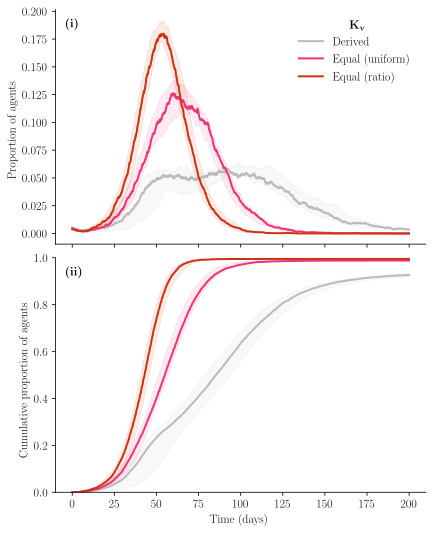

In [17]:
def plot_infections_itn_use(data, ax, colours, labels):    
    for i, (data_sub, c, l) in enumerate(zip(data.values(), colours, labels)):
        infections = np.array([np.sum(data_sub[i]["agent_disease_counts"],axis=0)[2] for i in range(len(data_sub))])/10053

        mins = np.min(infections, axis=0)
        maxs = np.max(infections, axis=0)

        ax.fill_between(data_sub[0]["time"],
                   mins,
                   maxs,
                   color=c,
                   alpha=.1)

        hl_run = run_similarity_orderings(infections)[0]
        ax.plot(data_sub[0]["time"],
                np.sum(data_sub[hl_run]["agent_disease_counts"],axis=0)[2]/10053,
                color=c,
                linewidth=2,
                label=l)


def plot_cum_infections_itn_use(data, ax, colours, labels):
    for i, (data_sub, c, l) in enumerate(zip(data.values(), colours, labels)):
        # compute cumsums for runs
        cumsums = np.zeros((len(data_sub), 2400))
        
        for r in range(len(data_sub)):
            df = pd.DataFrame(data_sub[r]["infection_records"])
            df = df.groupby(by=["time"]).size().reset_index()
            cumsums[r, df.time] = df.iloc[:, 1]
            cumsums[r] = cumsums[r].cumsum()/10053
        
        mins = np.min(cumsums, axis=0)
        maxs = np.max(cumsums, axis=0)
        ax.fill_between(data_sub[0]["time"],
                               mins,
                               maxs,
                               color=c,
                               alpha=.1)
        
        ax.plot(data_sub[0]["time"],
                cumsums[run_similarity_orderings(cumsums)[0]],
                color=c,
                linewidth=2,
                label=l)


fig, axs = plt.subplots(layout='constrained',
                        nrows=2, ncols=1, sharex=True,
                        figsize=(IDEAL_FIG_SIZE[0]*1, IDEAL_FIG_SIZE[1]*2))

risk_group_colours = scenario_colours
plot_infections_itn_use(data, axs[0], risk_group_colours, scenario_labs)
plot_cum_infections_itn_use(data, axs[1], risk_group_colours, scenario_labs)

# axs[0].set_title(r"Infected agents over time for different patch carrying capacities")
axs[0].legend(title=r"$\mathbf{K_v}$")

axs[0].annotate(r"\textbf{(i)}", xy=(0.025, 0.925), xycoords="axes fraction")
axs[1].annotate(r"\textbf{(ii)}", xy=(0.025, 0.925), xycoords="axes fraction")

axs[1].set_xlabel("Time (days)")
axs[1].set_ylim(0,1)

axs[0].set_ylabel("Proportion of agents")
axs[1].set_ylabel("Cumulative proportion of agents")


plt.savefig('figs/k_v_agent_infection.pdf')

(2) Risk group specific [2x3]

In [18]:
fig, axs = plt.subplots(nrows=2, ncols=3, sharey='row', sharex=True, figsize=(IDEAL_FIG_SIZE[0]*1.75, IDEAL_FIG_SIZE[1]*1.75))

def plot_non_cum_row(data, row_ax, colours, itn_labs, legend_no=0):
    # for each ax in row look at risk group
    for i, ax in enumerate(row_ax):
        
        # for each ITN use run set, plot lines
        for j, (data_sub, itn_lab) in enumerate(zip(data.values(), itn_labs)):
            infections = np.array([data_sub[r]["agent_disease_counts"][i][2]/data_sub[r]['amts'][i] for r in range(len(data_sub))])

            mins = np.min(infections, axis=0)
            maxs = np.max(infections, axis=0)
            ax.fill_between(data_sub[0]["time"],
                               mins,
                               maxs,
                               color=colours[j],
                               alpha=.1)
    
            hl_run = run_similarity_orderings(infections)[0]
            ax.plot(data_sub[0]["time"],
                    data_sub[hl_run]["agent_disease_counts"][i][2]/data_sub[hl_run]['amts'][i],
                    color=colours[j],
                    linewidth=2,
                    label=itn_labs[j] if i == legend_no else None)


def plot_cum_row(data, row_ax, colours, itn_labs, legend_no=0):
    # for each ax in row look at risk group
    for i, ax in enumerate(row_ax):
        
        # for each ITN use run set, plot cumulative infection lines
        for j, (data_sub, itn_lab) in enumerate(zip(data.values(), itn_labs)):
            cum_infs = np.array([data_sub[r]["agent_infected_unique"][i].cumsum()/data_sub[r]['amts'][i] for r in range(len(data_sub))])
    
            mins = np.min(cum_infs, axis=0)
            maxs = np.max(cum_infs, axis=0)
            ax.fill_between(data_sub[0]["time"],
                               mins,
                               maxs,
                               color=colours[j],
                               alpha=.1)
    
            hl_run = run_similarity_orderings(cum_infs)[0]
            ax.plot(data_sub[0]["time"],
                    data_sub[hl_run]["agent_infected_unique"][i].cumsum()/data_sub[hl_run]['amts'][i],
                    linewidth=2,
                    color=colours[j])
            
legend_no = 0

plot_non_cum_row(data, axs[0, :], scenario_colours, scenario_labs, legend_no=legend_no)
plot_cum_row(data, axs[1, :], scenario_colours, scenario_labs)

axs[0,0].set_title("Forest workers")
axs[0,1].set_title("Field workers")
axs[0,2].set_title("Non-workers")

# fig.supylabel("Proportion of infected agents")
axs[0,0].set_ylabel("Proportion of agents")
axs[1,0].set_ylabel("Cumulative proportion")

axs[0,legend_no].legend(title=r"$\mathbf{K_v}$")

# fig.suptitle("Impacts of mosquito carrying capacities across patches on infected agents by occupation")
fig.supxlabel("Time (days)")

fig.tight_layout()
plt.savefig('figs/k_v_risk_groups.pdf')

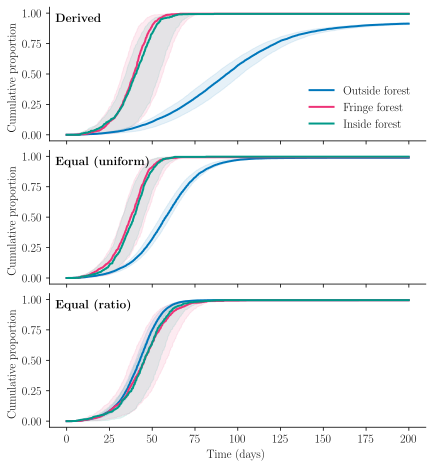

In [19]:
fig, axs = plt.subplots(layout='constrained',
                        nrows=3, ncols=1,
                        # sharey='row',
                        sharex=True,
                        figsize=(IDEAL_FIG_SIZE[0]*1, IDEAL_FIG_SIZE[1]*1.75))

# each ax shows patch cum. infections for outside/fringe/inside forest
def plot_cum_patch_infs(data, row, patch_colours, row_labels, patch_labels, legend_no=0):
    for i, (ax, data_sub, l) in enumerate(zip(row, data.values(), row_labels)):
        ax.annotate(r"\textbf{"+l+"}", xy=(0.015, 0.89), xycoords="axes fraction")
        
        for patch_id, c, patch_l in zip(range(3), patch_colours, patch_labels):
            # compute cumsums for runs
            cumsums = np.zeros((len(data_sub), 2400))
            for r in range(len(data_sub)):
                df = pd.DataFrame(data_sub[r]["infection_records"])
                df = df[df.home_patch == patch_id].groupby(by=["time"]).size().reset_index()
                cumsums[r, df.time] = df.iloc[:, 1]
                cumsums[r] = cumsums[r].cumsum()/data_sub[r]["agent_group_pops"][patch_id]
            
            mins = np.min(cumsums, axis=0)
            maxs = np.max(cumsums, axis=0)
            ax.fill_between(data_sub[0]["time"],
                                   mins,
                                   maxs,
                                   color=c,
                                   alpha=.1)
            
            ax.plot(data_sub[0]["time"],
                    cumsums[run_similarity_orderings(cumsums)[0]],
                    color=c,
                    linewidth=2,
                    label=patch_l if i == legend_no else None)
        if legend_no == i: ax.legend()#title=r"$\mathbf{K_v}$")

plot_cum_patch_infs(data,
                    axs,
                    [cmap[1], cmap[3], cmap[5]],
                    scenario_labs,
                    ["Outside forest", "Fringe forest", "Inside forest"])

axs[2].set_xlabel("Time (days)")

for i in range(3): axs[i].set_ylabel("Cumulative proportion")

plt.savefig('figs/k_v_cum_infected_agents.pdf')

---

# Graveyard

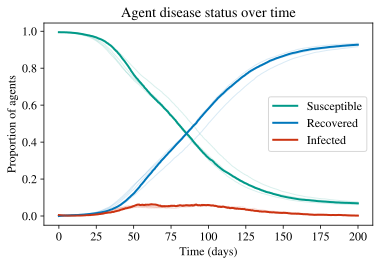

In [120]:
cmap = tol_cset('vibrant')

colours = [
    cmap[5],
    cmap[0],
    cmap[4],
    cmap[1]
]

hl_run = 1
plt.figure(figsize=ideal_fig_size)

for run_no, run in enumerate(data):
    # susceptible
    plt.plot(run["time"],
             np.sum(run["agent_disease_counts"],axis=0)[0]/10053, # TODO: aggregate agent disease counts.
             color=colours[0],
             linewidth=2 if hl_run == run_no else 1,
             alpha=1 if hl_run == run_no else .15,
             label="Susceptible" if (run_no == hl_run) or (hl_run is None and run_no == 0) else None)

    # exposed
    # plt.plot(run["time"],
    #          np.sum(run["agent_disease_counts"],axis=0)[1]/10053, # TODO: aggregate agent disease counts.
    #          color=colours[1],
    #          linewidth=2 if hl_run == run_no else 1,
    #          alpha=1 if hl_run == run_no else .15,
    #          label="Exposed" if run_no == hl_run or (hl_run is None and run_no == 0 else None)

    # recovered
    plt.plot(run["time"],
             np.sum(run["agent_disease_counts"],axis=0)[3]/10053,
             color=colours[3],
             linewidth=2 if hl_run == run_no else 1,
             alpha=1 if hl_run == run_no else .15,
             label="Recovered" if (run_no == hl_run) or (hl_run is None and run_no == 0) else None)
    
    # infected
    plt.plot(run["time"],
             np.sum(run["agent_disease_counts"],axis=0)[2]/10053,
             color=colours[2],
             linewidth=2 if hl_run == run_no else 1,
             alpha=1 if hl_run == run_no else .15,
             label="Infected" if (run_no == hl_run) or (hl_run is None and run_no == 0) else None)

plt.title("Agent disease status over time")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents")

plt.legend()
plt.show()

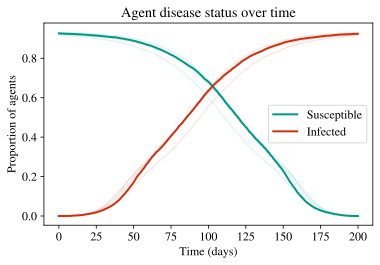

In [118]:
cmap = tol_cset('vibrant')

colours = [
    cmap[5],
    cmap[0],
    cmap[4],
    cmap[1]
]

hl_run = 1
plt.figure(figsize=ideal_fig_size)

for run_no, run in enumerate(data):
    # susceptible
    # plt.plot(run["time"],
    #          np.sum(run["agent_disease_counts"],axis=0)[0]/10053, # TODO: aggregate agent disease counts.
    #          color=colours[0],
    #          linewidth=2 if hl_run == run_no else 1,
    #          alpha=1 if hl_run == run_no else .15,
    #          label="Susceptible" if (run_no == hl_run) or (hl_run is None and run_no == 0) else None)

    # cum_sus = np.sum(run["agent_disease_counts"],axis=0)[0]
    # cum_sus[1:] = (cum_sus[:-1]-cum_sus[1:]).cumsum()[::-1]
    # cum_sus[0] = cum_sus[1]

    # cum_sus = -1*np.diff(np.sum(run["agent_disease_counts"],axis=0)[0]).cumsum()[::-1]/10053
    # plt.plot(run["time"],
    #          [cum_sus[0]] + list(cum_sus),
    #          color=colours[0],
    #          linewidth=2 if hl_run == run_no else 1,
    #          alpha=1 if hl_run == run_no else .15,
    #          label="Susceptible" if (run_no == hl_run) or (hl_run is None and run_no == 0) else None)
    

    # exposed
    # plt.plot(run["time"],
    #          np.sum(run["agent_disease_counts"],axis=0)[1]/10053, # TODO: aggregate agent disease counts.
    #          color=colours[1],
    #          linewidth=2 if hl_run == run_no else 1,
    #          alpha=1 if hl_run == run_no else .15,
    #          label="Exposed" if run_no == hl_run or (hl_run is None and run_no == 0 else None)

    # recovered
    # plt.plot(run["time"],
    #          np.sum(run["agent_disease_counts"],axis=0)[3]/10053,
    #          color=colours[3],
    #          linewidth=2 if hl_run == run_no else 1,
    #          alpha=1 if hl_run == run_no else .15,
    #          label="Recovered" if (run_no == hl_run) or (hl_run is None and run_no == 0) else None)
    
    # infected
    plt.plot(run["time"],
             np.sum(run["agent_infected_unique"],axis=0).cumsum()/10053,
             color=colours[2],
             linewidth=2 if hl_run == run_no else 1,
             alpha=1 if hl_run == run_no else .15,
             label="Infected" if (run_no == hl_run) or (hl_run is None and run_no == 0) else None)


plt.title("Agent disease status over time")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents")

plt.legend()
plt.show()

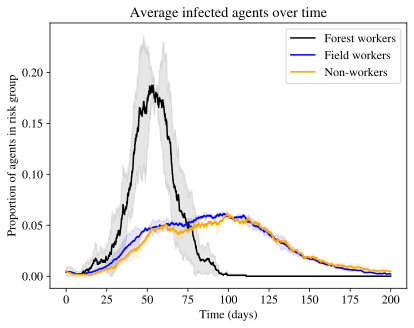

In [14]:
num_runs = len(data)
names = ["Forest workers", "Field workers", "Non-workers"]
palette = ["black", "blue", "orange", "green"]

for j, name, c in zip(range(3), names, palette):
    avgs = np.mean([data[i]["agent_disease_counts"][j][2]/data[i]['amts'][j] for i in range(num_runs)],axis=0)
    plt.plot(data[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std([data[i]["agent_disease_counts"][j][2]/data[i]['amts'][j] for i in range(num_runs)],axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(data[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average infected agents over time")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()

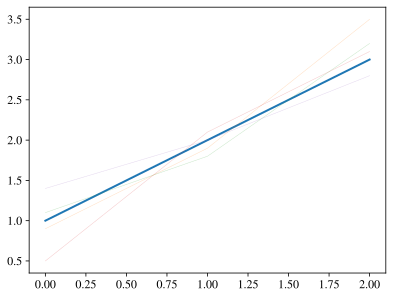

In [379]:
def get_hl_run(arrs):
    """Finds most representative run by minimising pairwise Euclidean
    distance given (num_runs) x (num_points) matrix."""
    
    

arrs = np.array([
    [1, 2, 3],
    [.9, 1.9, 3.5],
    [1.1, 1.8, 3.2],
    [.5, 2.1, 3.1],
    [1.4, 2, 2.8]
])

hl = run_similarity_orderings(arrs)[0]
for i, a in enumerate(arrs): plt.plot(a, linewidth=2 if i == hl else .5, alpha=1 if i == hl else .25)